<a href="https://www.pieriandata.com"><img src="../DATA/Logo.jpg"></a>

# Blurring and Smoothing

In blurring, we simple blur an image. An image looks more sharp or more detailed if we are able to perceive all the objects and their shapes correctly in it. For example. An image with a face, looks clear when we are able to identify eyes, ears, nose, lips, forehead e.t.c very clear. This shape of an object is due to its edges. So in blurring, we simple reduce the edge content and makes the transition form one color to the other very smooth.

### Blurring vs zooming

You might have seen a blurred image when you zoom an image. When you zoom an image using pixel replication, and zooming factor is increased, you saw a blurred image. This image also has less details, but it is not true blurring.

Because in zooming, you add new pixels to an image, that increase the overall number of pixels in an image, whereas in blurring, the number of pixels of a normal image and a blurred image remains the same.

Often bluring or smoothing is combined with edge detection. Edge detection algorithms detect too many edges when shown a high resolution image without any blurring.
There are a lot of different effects and filters we can apply to images. We're just going to go through a few of them here. Most of them involve some sort of math based function being applied to all the pixels values.


-----
#### Info Link on Blurring Math:

http://people.csail.mit.edu/sparis/bf_course/

http://setosa.io/ev/image-kernels/

https://en.wikipedia.org/wiki/Gaussian_blur

https://www.tutorialspoint.com/dip/concept_of_blurring.htm

------

## Convenience Functions

Quick function for loading the puppy image.

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [4]:
def load_img():
    img = cv2.imread('../DATA/bricks.jpg').astype(np.float32) / 255
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

We use, in this case, **astype(np.float32)** to have decimal number because we need to divide every entrance value by 255 to save the image with values from 0-1.

In [9]:
i = load_img()
i

array([[[0.78431374, 0.7882353 , 0.80784315],
        [0.7529412 , 0.77254903, 0.79607844],
        [0.7254902 , 0.7647059 , 0.8       ],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       [[0.8784314 , 0.88235295, 0.9019608 ],
        [0.7647059 , 0.78431374, 0.80784315],
        [0.7019608 , 0.7529412 , 0.78431374],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       [[0.85490197, 0.8666667 , 0.89411765],
        [0.6509804 , 0.6784314 , 0.70980394],
        [0.4862745 , 0.5372549 , 0.57254905],
        ...,
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ],
        [0.7764706 , 0.76862746, 0.7882353 ]],

       ...,

       [[0.8509804 , 0.83137256, 0.84705883],
        [0.84705883, 0.827451  , 0.84313726],
        [0.84313726, 0

In [10]:
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

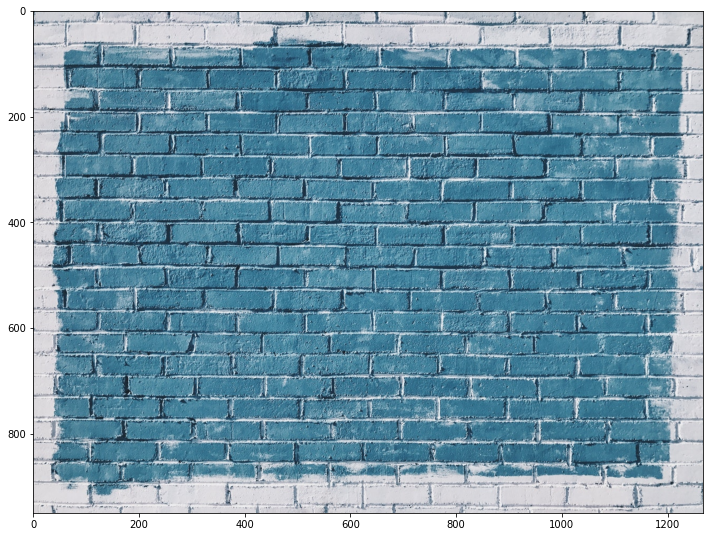

In [11]:
display_img(i)

-------

### Gamma Correction : Practical Effect of Increasing Brightness

Gamma correction can be applied to an image to make it appear brighter or darker depending on the **gamma value** chosen. Every entrance is:

$$
img[row,col]^{\gamma}
$$

The more greater gamma is, the darker the image will be.

- $\gamma = \frac{1}{4}$**:**

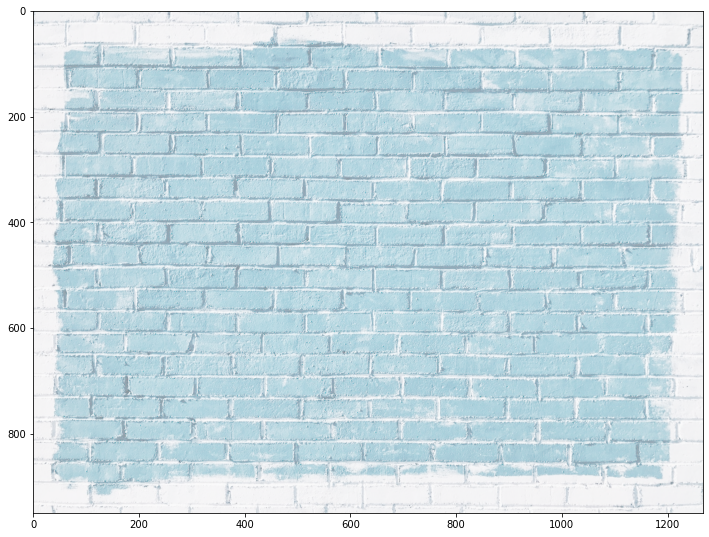

In [12]:
img = load_img()
gamma = 1/4
effected_image = np.power(img, gamma)
display_img(effected_image)

- $\gamma = 2$**:**

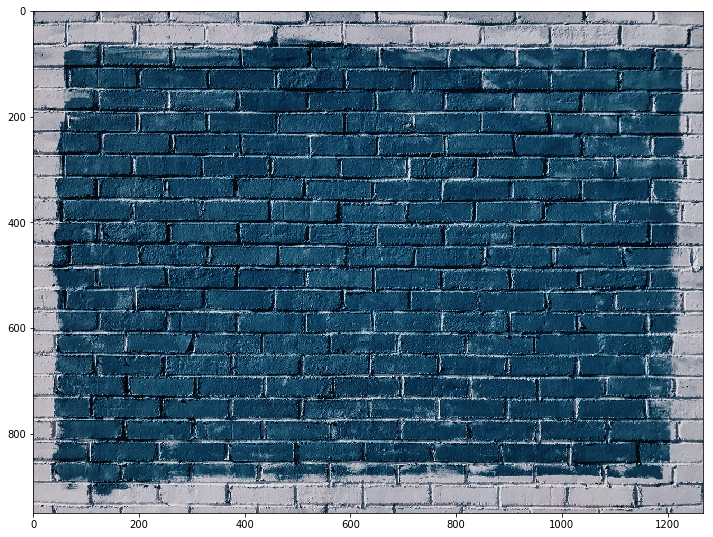

In [7]:
img = load_img()
gamma = 2
effected_image = np.power(img, gamma)
display_img(effected_image)

- $\gamma = 8$**:**

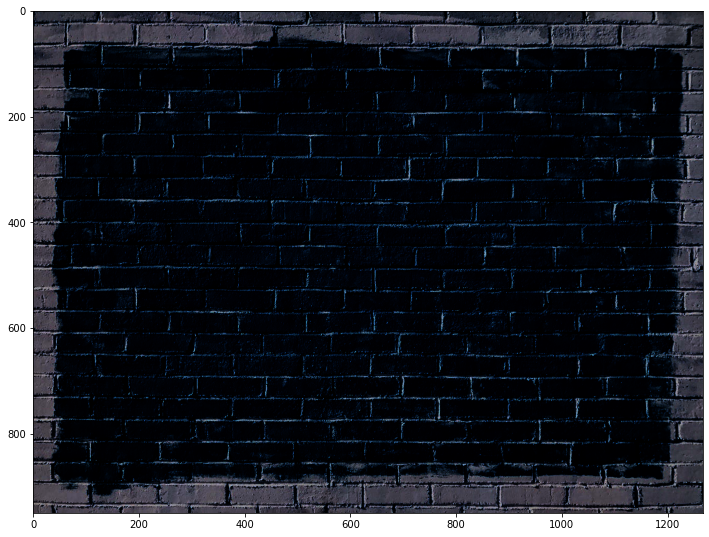

In [13]:
img = load_img()
gamma = 8
effected_image = np.power(img, gamma)
display_img(effected_image)

### Low Pass Filter with a 2D Convolution

A fitlering operation known as 2D convolution can be used to create a low-pass filter. Make sure to view the video for an explanation of what's happening in the code below. We will just add a red text.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


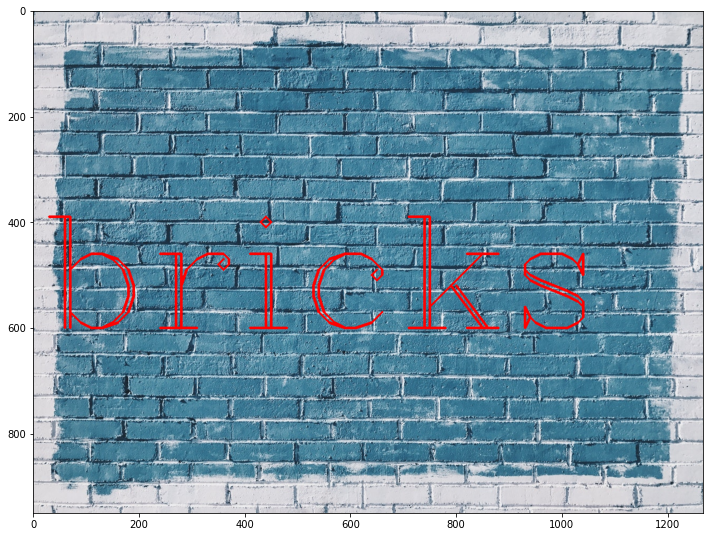

In [17]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),thickness=4)
display_img(img)

### Create the Kernel

Kernels can be applied over an image to produce a variety of effects. An image kernel is a small matrix used to apply effects like the ones you might find in Photoshop or Gimp, such as blurring, sharpening, outlining or embossing. They're also used in machine learning for 'feature extraction', a technique for determining the most important portions of an image. In this context the process is referred to more generally as "convolution" (see: convolutional neural networks - https://en.wikipedia.org/wiki/Convolutional_neural_network.)

**Types of filters** (https://en.wikipedia.org/wiki/Kernel_(image_processing))

Blurring can be achieved by many ways. The common type of filters that are used to perform blurring are.
- Mean filter
- Weighted average filter
- Gaussian filter

**Mean filter:** Mean filter is also known as Box filter and average filter. A mean filter has the following properties.

- It must be odd ordered
- The sum of all the elements should be 1
- All the elements should be same

**Weighted average filter:** In weighted average filter, we gave more weight to the center value. Due to which the contribution of center becomes more then the rest of the values. Due to weighted average filtering, we can actually control the blurring.
Properties of the weighted average filter are:

- It must be odd ordered
- The sum of all the elements should be 1
- The weight of center element should be more then all of the other elements

The greater the kernel is, the blurred the image will be.

Let's create a kernel:

In [18]:
kernel = np.ones(shape=(5,5),dtype=np.float32)/25

In [19]:
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

This kernel satisfies the mean filter conditions.

## Averaging (mean filter)

There are two way to applicate this filter: **cv2.filter2D**  and **cv2.blur()**.

**dst = cv2.filter2D(src, ddepth, kernel):**

- **src:** input image.
- **dst:** output image of the same size and the same number of channels as src.
- **ddepth:** desired depth of the destination image, see combinations.
- **kernel:** convolution kernel (or rather a correlation kernel), a single-channel floating point matrix; if you want to apply different kernels to different channels, split the image into separate color planes using split and process them individually.

when ddepth=-1, the output image will have the same depth as the source.

Convolves an image with the kernel. The function applies an arbitrary linear filter to an image. In-place operation is supported. When the aperture is partially outside the image, the function interpolates outlier pixel values according to the specified border mode. The function does actually compute correlation, not the convolution:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


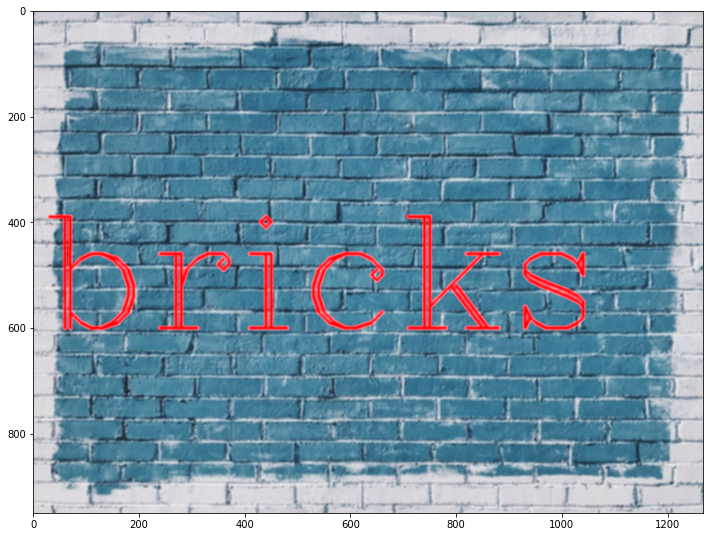

In [20]:
dst = cv2.filter2D(img,-1,kernel)
display_img(dst)

It is aprreciated tha the space inside every letter turns into a little bit pink.

- **blur():**

**dst = cv2.blur(src, ksize)**

- **src:**	input image; it can have any number of channels, which are processed independently, but the depth should be CV_8U, CV_16U, CV_16S, CV_32F or CV_64F.
- **dst:**	output image of the same size and type as src.
- **ksize:** blurring kernel size.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


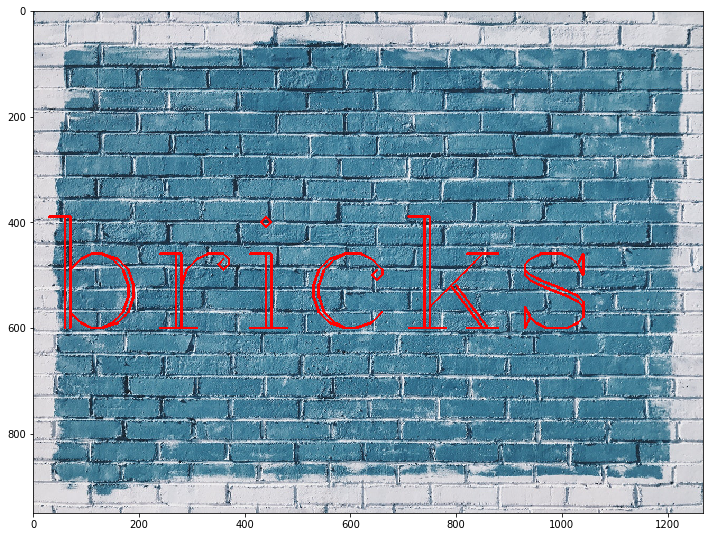

In [12]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),
            thickness=4)
display_img(img)

We will use a kernel that is equal to the previous one used.

In [21]:
blurred_img = cv2.blur(img,ksize=(5,5))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


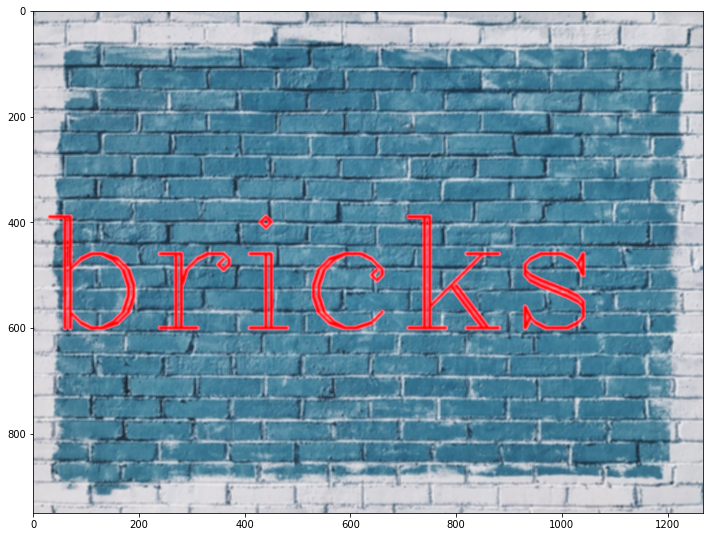

In [22]:
display_img(blurred_img)

The same pink effect was gotten

- **kernel 10x10:**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


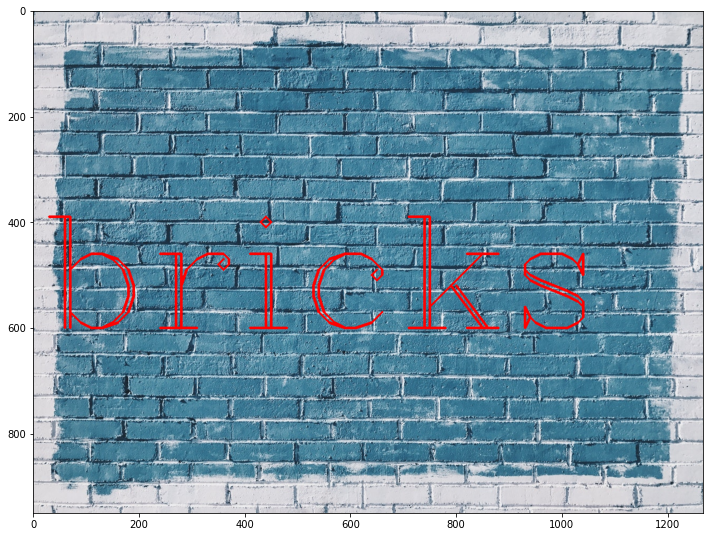

In [23]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),
            thickness=4)
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


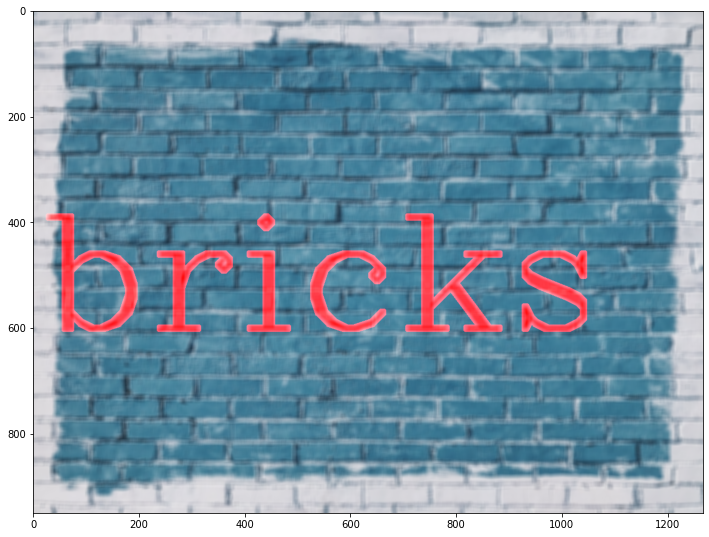

In [24]:
blurred_img = cv2.blur(img,ksize=(10,10))
display_img(blurred_img)

¡Is blurrer!

## Gaussian Blurring
Blurs an image using a Gaussian filter. The function convolves the source image with the specified Gaussian kernel. In-place filtering is supported.

**dst = cv2.GaussianBlur(src,ksize,sigmaX,sigmaY):**

- **src:**	input image; the image can have any number of channels, which are processed independently, but the depth should be CV_8U, CV_16U, CV_16S, CV_32F or CV_64F.
- **dst:**	output image of the same size and type as src.
- **ksize:**	Gaussian kernel size. ksize.width and ksize.height can differ but they both must be positive and odd. Or, they can be zero's and then they are computed from sigma.
- **sigmaX:**	Gaussian kernel standard deviation in X direction.
- **sigmaY:**	Gaussian kernel standard deviation in Y direction; if sigmaY is zero, it is set to be equal to sigmaX, if both sigmas are zeros, they are computed from ksize.width and ksize.height, respectively (see getGaussianKernel for details); to fully control the result regardless of possible future modifications of all this semantics, it is recommended to specify all of ksize, sigmaX, and sigmaY.

**Kernel**

We need the gaussian function in two dimentions:
$$
G(x,y) = \frac{1}{2\pi\sigma^{2}}e^{-\frac{x^{2} + y^{2}}{2\simga^{2}}}
$$

- **x:** the distance from the origin in te horizontal axis.
- **y:** the distance from the origin in te vertical axis.
- $\sigma$**:** the standard desviation of the Gaussian distribution.

When applied in two dimensions, this formula produces a surface whose contours are concentric circles with a Gaussian distribution from the center point. The matrix order must be odd.

Example with certain $\sigma$:

- **3x3 (approximation)**:
$$
\frac{1}{16}\begin{bmatrix}
1 & 2 & 1 \\
2 & 4 & 2 \\
1 & 2 & 1 \\\end{bmatrix}
$$

- **5x5 (approximation)**:
$$
\frac{1}{256}\begin{bmatrix}
1 & 4  & 6  & 4  & 1 \\
4 & 16 & 24 & 16 & 4 \\
6 & 24 & 36 & 24 & 6 \\
4 & 16 & 24 & 16 & 4 \\
1 & 4  & 6  & 4  & 1 \\\end{bmatrix}
$$

The greater $\sigma$ is, the blurred the image is.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


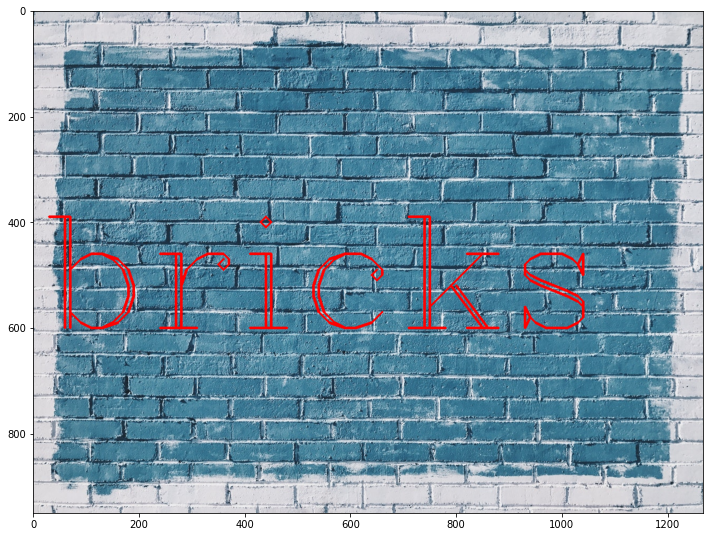

In [25]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),thickness=4)
display_img(img)

Let's choose a **kernelsize=5x5** and $\sigma=10$.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


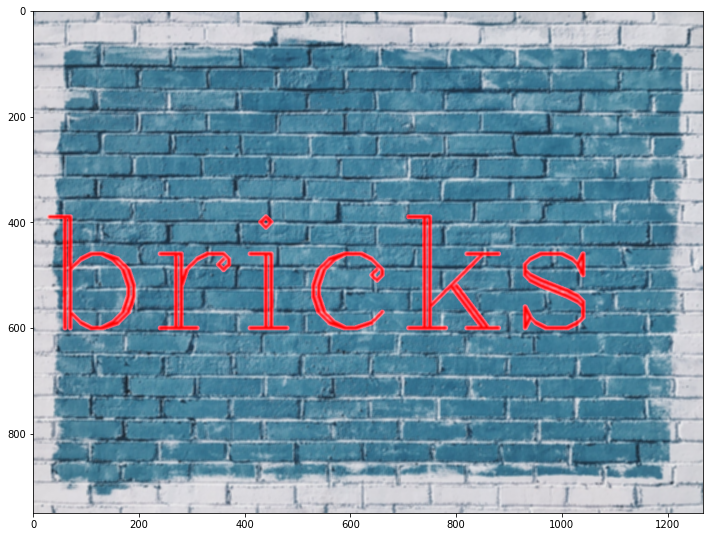

In [26]:
blurred_img = cv2.GaussianBlur(img,(5,5),10)
display_img(blurred_img)

We got the same pink effect as averaging blur has.

- $\sigma = 10$ **and kernel size = 15x15:**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


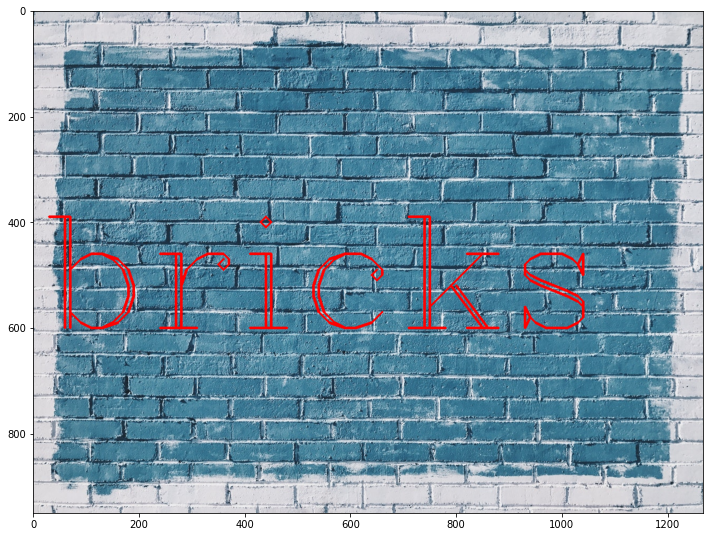

In [27]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),thickness=4)
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


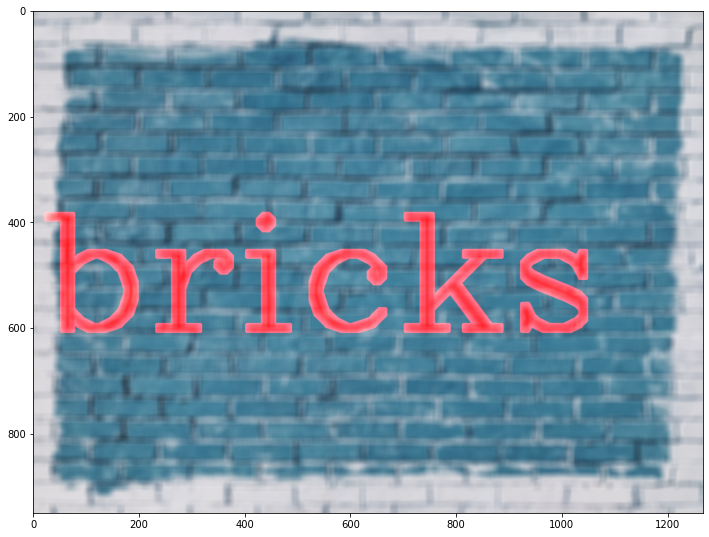

In [34]:
blurred_img = cv2.GaussianBlur(img,(15,15),10)
display_img(blurred_img)

We got so far the blurriest image.

## Median Blurring (median filter)

While the “Gaussian” blur filter calculates the mean of the neighboring pixels, the “Median” blur filter calculates the median. Example with a kernel size 9x9 (the kernel is not fixed, depends on the region of the image where it is taken):

$$
\begin{matrix}
223 & 186 & 114 \\
204 & 161 & 106 \\
219 & 194 & 138
\end{matrix}
$$
$$
\rightarrow 106 \,\,114 \,\, 138 \,\, 161 \,\, 186 \,\, 194 \,\, 204 \,\, 219 \,\, 223
$$
$$
median = 186
$$

This calculation does not create a new value, and an unrepresentative pixel in the neighborhood will not affect the result. So, the filter preserves edges and rounds corners. It is used to reduce noise, especially salt and pepper noise, and delete scratches on photographs.

**dst=cv.medianBlur(src,ksize):**

- **src:**	input 1-, 3-, or 4-channel image; when ksize is 3 or 5, the image depth should be CV_8U, CV_16U, or CV_32F, for larger aperture sizes, it can only be CV_8U.
- **dst:**	destination array of the same size and type as src.
- **ksize:**	aperture linear size; it must be odd and greater than 1, for example: 3, 5, 7..

Blurs an image using the median filter. The function smoothes an image using the median filter with the **ksize×ksize** aperture. Each channel of a multi-channel image is processed independently. In-place operation is supported.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


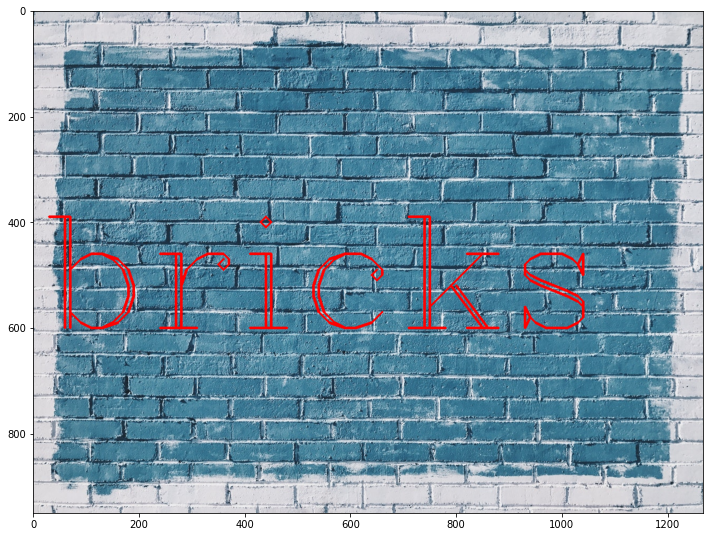

In [35]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),thickness=4)
display_img(img)

**kernel size = 5x5:**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


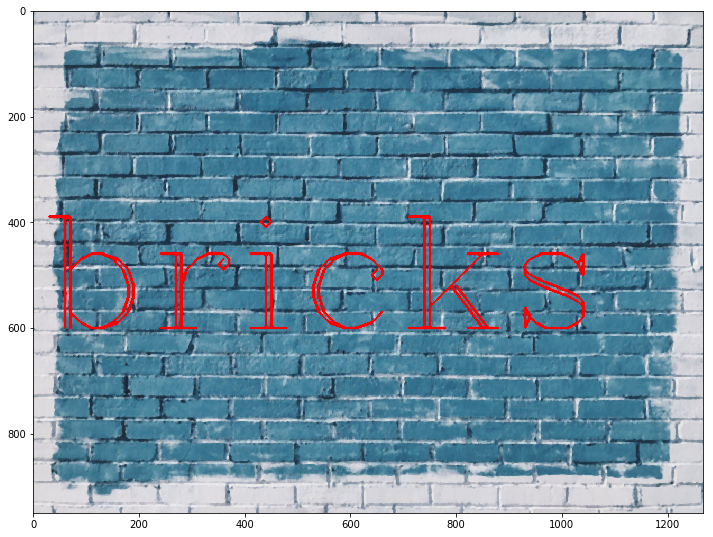

In [18]:
median = cv2.medianBlur(img,5)
display_img(median)

We can appreciate that the wall is a little bit blurred but keeps the edges of the text "brick".

----------
### Adding Noise

Let's see a more useful case of Median Blurring by adding some random noise to an image.

In [49]:
img = cv2.imread('../DATA/sammy.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [37]:
img.max()

255

In [38]:
img.min()

0

In [40]:
img.mean()

89.33240744375256

In [41]:
img.shape

(1367, 1025, 3)

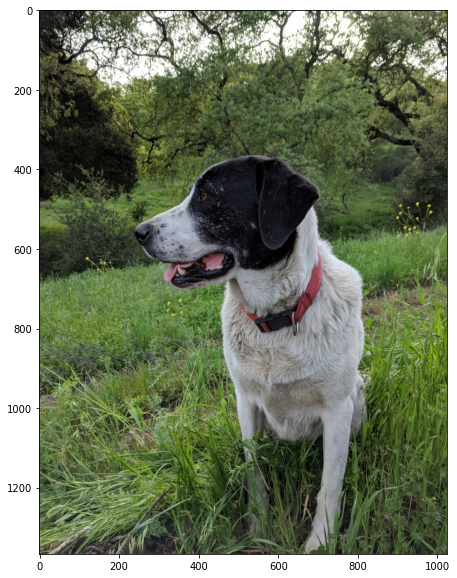

In [50]:
display_img(img)

In [52]:
noise_img = cv2.imread('../DATA/sammy_noise.jpg')

The noise was added using the function **np.noise()**.

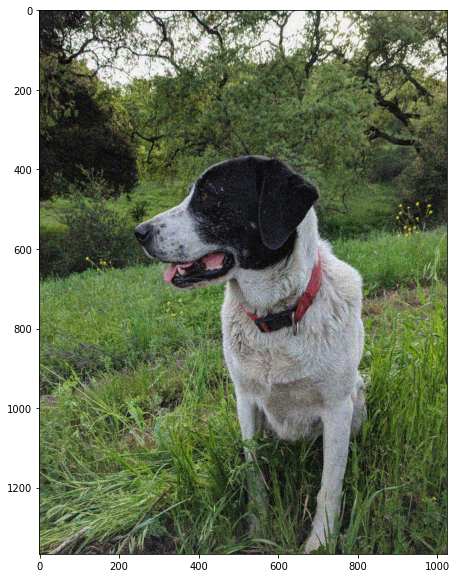

In [53]:
display_img(noise_img)

Now, we use a median filter to reduce the noise in the *noise_img*.

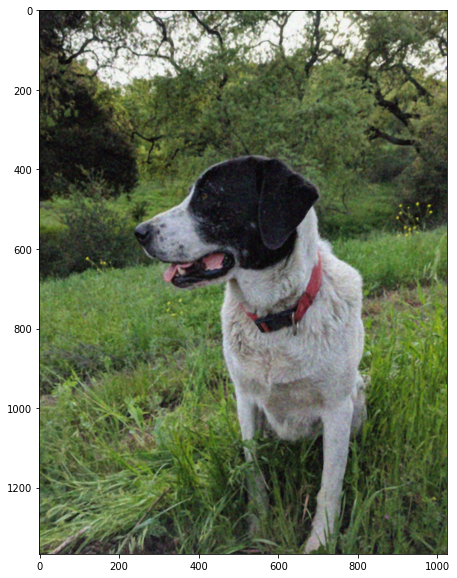

In [54]:
median = cv2.medianBlur(noise_img,5)
display_img(median)

The noise was reduced.

--------

## Bilateral Filtering

This filter reduce the unwanted noise and keep the image edges sharp. **cv.bilateralFilter()** is highly effective in noise removal while keeping edges sharp. But the operation is slower compared to other filters. We already saw that a Gaussian filter takes the neighbourhood around the pixel and finds its Gaussian weighted average. This Gaussian filter is a function of space alone, that is, nearby pixels are considered while filtering. It doesn't consider whether pixels have almost the same intensity. It doesn't consider whether a pixel is an edge pixel or not. So it blurs the edges also, which we don't want to do.

Bilateral filtering also takes a Gaussian filter in space, but one more Gaussian filter which is a function of pixel difference. The Gaussian function of space makes sure that only nearby pixels are considered for blurring, while the Gaussian function of intensity difference makes sure that only those pixels with similar intensities to the central pixel are considered for blurring. So it preserves the edges since pixels at edges will have large intensity variation.

Filter definition: https://en.wikipedia.org/wiki/Bilateral_filter#:~:text=A%20bilateral%20filter%20is%20a,based%20on%20a%20Gaussian%20distribution.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


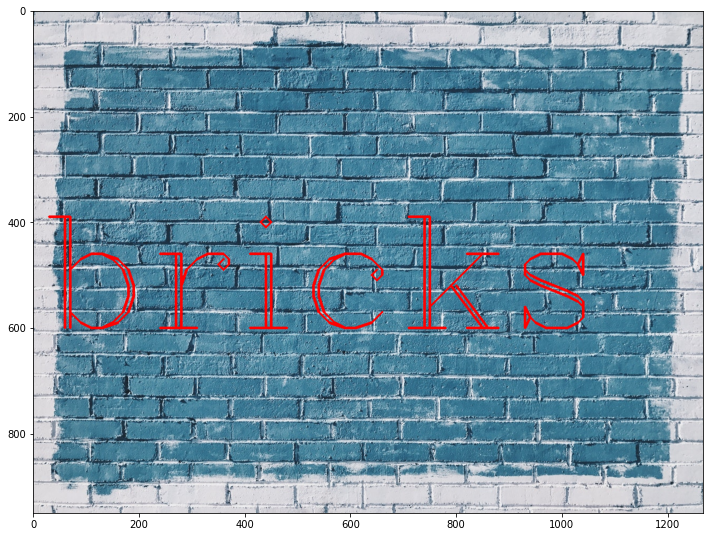

In [55]:
img = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img,text='bricks',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),thickness=4)
display_img(img)

**dst=cv.bilateralFilter(src,d,sigmaColor,sigmaSpace):**

- **src:**	Source 8-bit or floating-point, 1-channel or 3-channel image.
- **dst:**	Destination image of the same size and type as src .
- **d:**	Diameter of each pixel neighborhood that is used during filtering. If it is non-positive, it is computed from sigmaSpace.
- **sigmaColor:**	Filter sigma in the color space. A larger value of the parameter means that farther colors within the pixel neighborhood (see sigmaSpace) will be mixed together, resulting in larger areas of semi-equal color.
- **sigmaSpace:**	Filter sigma in the coordinate space. A larger value of the parameter means that farther pixels will influence each other as long as their colors are close enough (see sigmaColor ). When d>0, it specifies the neighborhood size regardless of sigmaSpace. Otherwise, d is proportional to sigmaSpace.

The function applies bilateral filtering to the input image, as described in http://www.dai.ed.ac.uk/CVonline/LOCAL_COPIES/MANDUCHI1/Bilateral_Filtering.html bilateralFilter can reduce unwanted noise very well while keeping edges fairly sharp. However, it is very slow compared to most filters.

- Sigma values: For simplicity, you can set the 2 sigma values to be the same. If they are small (< 10), the filter will not have much effect, whereas if they are large (> 150), they will have a very strong effect, making the image look "cartoonish".
- Filter size: Large filters (d > 5) are very slow, so it is recommended to use d=5 for real-time applications, and perhaps d=9 for offline applications that need heavy noise filtering.

Choosing **d=9, sigmaColor=75, sigmaSpace=75:**

In [56]:
blur = cv2.bilateralFilter(img,9,75,75)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


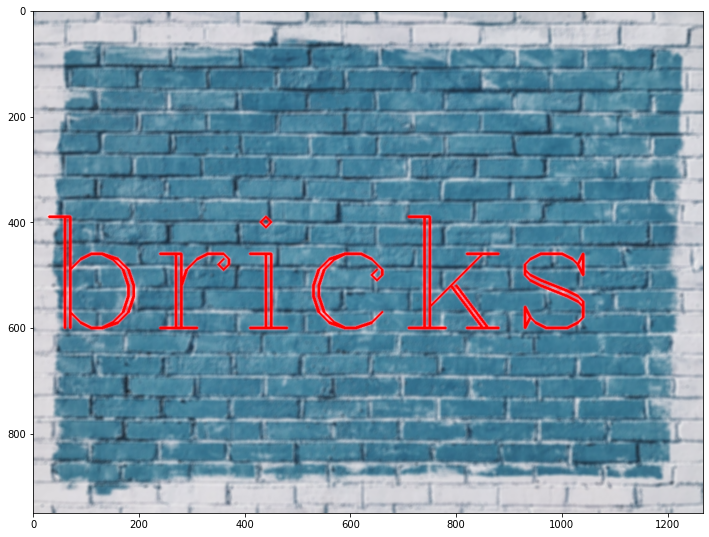

In [57]:
display_img(blur)

The wall is blurred, but the text keep its edges sharp.

## Great Work! Hopefully now you could imagine how software like PhotoShop or Google Images works!